In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import umap

import bokeh
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS, Slider, TapTool, TextInput, ColorMapper
from bokeh.transform import linear_cmap, transform
from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import RadioButtonGroup, TextInput, Div, Paragraph
from bokeh.layouts import column, widgetbox, row, layout
from bokeh.layouts import column

In [2]:
df_En=pd.read_csv("preprocessed_data_en.csv")
df_De=pd.read_csv("preprocessed_data_de.csv")

In [3]:
vectorizer_En = TfidfVectorizer(input= 'preprocessed_data_en.csv', smooth_idf=True)
vectorizer_De = TfidfVectorizer(input= 'preprocessed_data_de.csv',smooth_idf=True)

df_En["text_lemmatization"]=df_En["text_lemmatization"].fillna("")
df_De["text_lemmatization"]=df_De["text_lemmatization"].fillna("")

X_En = vectorizer_En.fit_transform(df_En["text_lemmatization"])
X_De = vectorizer_De.fit_transform(df_De["text_lemmatization"])


print(X_En.shape) # check shape of the document-term matrix
print(X_De.shape)

(2406, 3281)
(3877, 5244)


# English data

For n_clusters=2, the silhouette score is 0.010081152918162133
For n_clusters=3, the silhouette score is 0.014925654251240034
For n_clusters=4, the silhouette score is 0.01372333324492788
For n_clusters=5, the silhouette score is 0.014640958714337689
For n_clusters=6, the silhouette score is 0.015798322368785873
For n_clusters=7, the silhouette score is 0.017669773506580607
For n_clusters=8, the silhouette score is 0.017452320977436646
For n_clusters=9, the silhouette score is 0.018850868555156393
For n_clusters=10, the silhouette score is 0.018449419804390674


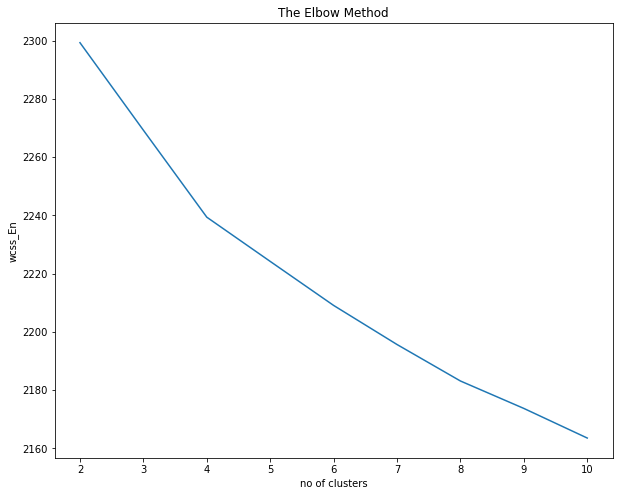

In [4]:
# The Elbow method and Silhouette Analysis are the popular methods to determine the optimal cluster number

#Building the Model
# wcss(within-cluster sums of squares) 
wcss_En=[]

#we assume the max number of cluster would be 10
for num_clusters_En in np.arange(2,11):
    kmeans_model_En = KMeans(n_clusters= num_clusters_En, init='k-means++')
    kmeans_En = kmeans_model_En.fit(X_En)
    wcss_En.append(kmeans_model_En.inertia_)  #inertia_ is sum of squared distances of samples to their closest cluster center.
    cluster_labels_En = kmeans_model_En.labels_
    
    # silhouette score
    silhouette_avg_En = silhouette_score(X_En, cluster_labels_En)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters_En, silhouette_avg_En))


#Visualizing the ELBOW method to get the optimal cluster number
plt.figure(figsize=(10, 8))
plt.plot(range(2,11), wcss_En)

plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss_En')
plt.show()

In [5]:
# We choose the number of clusters to be 4, 6, and 7 to visualize the data. 
output_notebook()

range_n_clusters_En = [4, 6, 7]

for num_clusters_En in range_n_clusters_En:
    kmeans_model_En = KMeans(n_clusters = num_clusters_En)        
    kmeans_En = kmeans_model_En.fit(X_En) # Compute k-means clustering
    kmeans_clusters_En = kmeans_En.predict(X_En) # Predict the closest cluster each sample in X belongs to.
    kmeans_distances_En = kmeans_En.transform(X_En) # Transform X to a cluster-distance space.
    
    sorted_centroids_En = kmeans_En.cluster_centers_.argsort()[:, ::-1] # kmeans_En.cluster_centers_ with a scale of N*D (number of clusters, number of words)
    terms_En = vectorizer_En.get_feature_names()
    
    # Select 6 keywords of each cluster.
    for i in range(num_clusters_En):
        print("Cluster %d:" % i)
        aux_En = ''
        for j in sorted_centroids_En[i, :6]:
            aux_En += terms_En[j] + ' | '
        print(aux_En)
        print() 
    
    # Visualization in 2D plane using UMAP
    umap_kmeans_En = umap.UMAP(n_neighbors=150, min_dist=0.5).fit_transform(kmeans_distances_En)

    kmeans_df_En = pd.DataFrame(umap_kmeans_En, columns=['x', 'y'])
    kmeans_df_En['cluster'] = kmeans_clusters_En
    kmeans_df_En['Nachrichtentyp'] = df_En['Nachrichtentyp']
    kmeans_df_En['Datun'] = df_En['Datun']
    kmeans_df_En['Uhrzeit'] = df_En['Uhrzeit']
    kmeans_df_En['Absender'] = df_En['Absender']
    kmeans_df_En['Ort'] = df_En['Ort']
    kmeans_df_En['Text'] = df_En['Text']
    kmeans_df_En['ID'] = df_En['ID']
    
    plot_kmeans_En = figure(plot_width=700, plot_height=600,
            title="KMeans clustering of the english text with num_clusters:" +'\n'+ str(num_clusters_En),
            tools=['hover', 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'save', 'tap'],
            x_axis_type=None, y_axis_type=None, min_border=1)
    
    colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
     "#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
     "#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
     "#52697d", "#194196", "#d27c88", "#36422b", "#b68f79"])
    
    source_En = ColumnDataSource(data=dict(x=kmeans_df_En['x'], y=kmeans_df_En['y'],
                                color=colormap[kmeans_clusters_En],
                                Nachrichtentyp=kmeans_df_En['Nachrichtentyp'],
                                Datun=kmeans_df_En['Datun'],
                                Uhrzeit=kmeans_df_En['Uhrzeit'],
                                Absender=kmeans_df_En['Absender'],
                                Ort=kmeans_df_En['Ort'],
                                Text=kmeans_df_En['Text'],
                                ID=kmeans_df_En['ID'],
                                cluster=kmeans_df_En['cluster']))
    
    plot_kmeans_En.scatter(x='x', y='y', color='color', source=source_En)
    hover_En = plot_kmeans_En.select(dict(type=HoverTool))
    hover_En.tooltips={"Nachrichtentyp": "@Nachrichtentyp", "Datun": "@Datun", "Uhrzeit":"@Uhrzeit", "Absender":"@Absender", "Ort":"@Ort", "Text":"@Text", "ID":"@ID", "cluster":"@cluster"}
    show(plot_kmeans_En)

Loading BokehJS ...

Cluster 0:
student | client | gbi | access | user | hana | 

Cluster 1:
reset | client | password | master | user | account | 

Cluster 2:
key | generate | user | developer | i78 | mandant | 

Cluster 3:
client | date | contract | team | university | provision | 



Cluster 0:
student | gbi | hana | case | study | user | 

Cluster 1:
client | date | contract | team | university | provision | 

Cluster 2:
access | connection | gui | domain | try | message | 

Cluster 3:
password | master | reset | user | account | lock | 

Cluster 4:
key | generate | user | developer | i78 | mandant | 

Cluster 5:
client | reset | refresh | erpsim | many | i45 | 



Cluster 0:
key | generate | user | i78 | developer | mandant | 

Cluster 1:
gbi | version | upgrade | client | access | update | 

Cluster 2:
password | master | reset | user | account | lock | 

Cluster 3:
student | case | create | study | user | account | 

Cluster 4:
client | date | contract | team | university | provision | 

Cluster 5:
reset | client | refresh | many | erpsim | i45 | 

Cluster 6:
access | hana | client | domain | university | team | 



# German data

For n_clusters=2, the silhouette score is 0.0049440125360490006
For n_clusters=3, the silhouette score is 0.005295503895894618
For n_clusters=4, the silhouette score is 0.005598898154542968
For n_clusters=5, the silhouette score is 0.006730486566390354
For n_clusters=6, the silhouette score is 0.007100384809189779
For n_clusters=7, the silhouette score is 0.008774731048306684
For n_clusters=8, the silhouette score is 0.00903907090425511
For n_clusters=9, the silhouette score is 0.010703021913361066
For n_clusters=10, the silhouette score is 0.01113657411551829


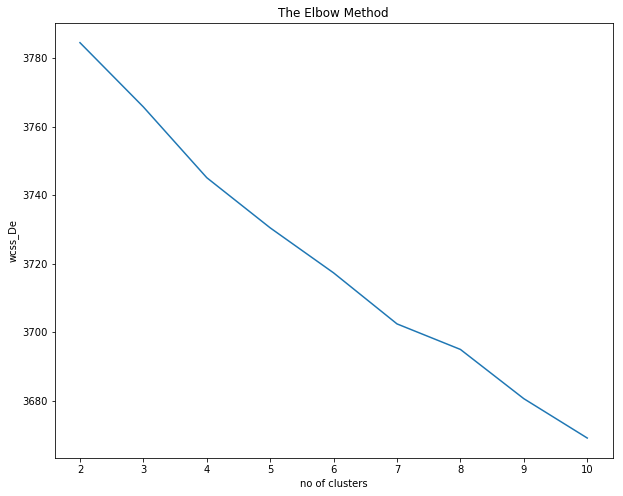

In [10]:
wcss_De=[]

#we assume the max number of cluster would be 10
for num_clusters_De in np.arange(2,11):
    kmeans_model_De = KMeans(n_clusters= num_clusters_De, init='k-means++')
    kmeans_De = kmeans_model_De.fit(X_De)
    wcss_De.append(kmeans_model_De.inertia_)  #inertia_ is sum of squared distances of samples to their closest cluster center.
    cluster_labels_De = kmeans_model_De.labels_
    
    # silhouette score
    silhouette_avg_De = silhouette_score(X_De, cluster_labels_De)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters_De, silhouette_avg_De))


#Visualizing the ELBOW method to get the optimal cluster number
plt.figure(figsize=(10, 8))
plt.plot(range(2,11), wcss_De)

plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss_De')
plt.show()

In [7]:
# We choose the number of clusters to be 4, 7,and 9 to visualize the data. 
output_notebook()
range_n_clusters_De = [4, 7, 9]

for num_clusters_De in range_n_clusters_De:
    kmeans_model_De = KMeans(n_clusters = num_clusters_De)        
    kmeans_De = kmeans_model_De.fit(X_De)
    kmeans_clusters_De = kmeans_De.predict(X_De)
    kmeans_distances_De = kmeans_De.transform(X_De)
    
    sorted_centroids_De = kmeans_De.cluster_centers_.argsort()[:, ::-1]
    terms_De = vectorizer_De.get_feature_names()
    
    for i in range(num_clusters_De):
        print("Cluster %d:" % i)
        aux_De = ''
        for j in sorted_centroids_De[i, :6]:
            aux_De += terms_De[j] + ' | '
        print(aux_De)
        print() 
            
    
    umap_kmeans_De = umap.UMAP(n_neighbors=150, min_dist=0.5).fit_transform(kmeans_distances_De)

    kmeans_df_De = pd.DataFrame(umap_kmeans_De, columns=['x', 'y'])
    kmeans_df_De['cluster'] = kmeans_clusters_De
    kmeans_df_De['Nachrichtentyp'] = df_De['Nachrichtentyp']
    kmeans_df_De['Datun'] = df_De['Datun']
    kmeans_df_De['Uhrzeit'] = df_De['Uhrzeit']
    kmeans_df_De['Absender'] = df_De['Absender']
    kmeans_df_De['Ort'] = df_De['Ort']
    kmeans_df_De['Text'] = df_De['Text']
    kmeans_df_De['ID'] = df_De['ID']
    
    plot_kmeans_De = figure(plot_width=700, plot_height=600,
            title="KMeans clustering of the german text with num_clusters:" +'\n'+ str(num_clusters_De),
            tools=['hover', 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'save', 'tap'],
            x_axis_type=None, y_axis_type=None, min_border=1)
    
    colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
     "#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
     "#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
     "#52697d", "#194196", "#d27c88", "#36422b", "#b68f79"])
    
    source_De = ColumnDataSource(data=dict(x=kmeans_df_De['x'], y=kmeans_df_De['y'],
                                color=colormap[kmeans_clusters_De],
                                Nachrichtentyp=kmeans_df_De['Nachrichtentyp'],
                                Datun=kmeans_df_De['Datun'],
                                Uhrzeit=kmeans_df_De['Uhrzeit'],
                                Absender=kmeans_df_De['Absender'],
                                Ort=kmeans_df_De['Ort'],
                                Text=kmeans_df_De['Text'],
                                ID=kmeans_df_De['ID'],
                                cluster=kmeans_df_De['cluster']))
    
    plot_kmeans_De.scatter(x='x', y='y', color='color', source=source_De)
    hover_De = plot_kmeans_De.select(dict(type=HoverTool))
    hover_De.tooltips={"Nachrichtentyp": "@Nachrichtentyp", "Datun": "@Datun", "Uhrzeit":"@Uhrzeit", "Absender":"@Absender", "Ort":"@Ort", "Text":"@Text", "ID":"@ID", "cluster":"@cluster"}
    show(plot_kmeans_De)

Loading BokehJS ...

Cluster 0:
team | hana | user | fehlermeldung | gbi | gut | 

Cluster 1:
mandanten | zurücksetzen | gbi | hiermit | bitten | rücksetzung | 

Cluster 2:
mandant | zurücksetzen | passwort | user | sperren | mandantenrücksetzung | 

Cluster 3:
niklas | grüsse | gut | können | bestätigung | bestellung | 



Cluster 0:
mandantenrücksetzung | schulung | sperren | vertragsende | i45 | i16 | 

Cluster 1:
gui | domain | adresse | zugreifen | remote | folgend | 

Cluster 2:
hana | team | vg | können | fehlermeldung | gut | 

Cluster 3:
mandanten | gbi | zurück | rücksetzung | setzen | mandant | 

Cluster 4:
niklas | grüsse | gut | können | bestätigung | bestellung | 

Cluster 5:
zurücksetzen | mandanten | mandant | bitten | i20 | passwort | 

Cluster 6:
user | master | passwort | anlegen | team | entwicklerschlüssel | 



Cluster 0:
mandantenrücksetzung | i81 | schulung | sperren | job | vg | 

Cluster 1:
hana | gui | version | lumira | installieren | team | 

Cluster 2:
niklas | grüsse | gut | können | bestätigung | bestellung | 

Cluster 3:
fehlermeldung | team | anlegen | fehler | fallstudie | vg | 

Cluster 4:
user | passwort | master | anlegen | team | portal | 

Cluster 5:
zurücksetzen | mandanten | mandant | i20 | passwort | hiermit | 

Cluster 6:
mandanten | mandant | rücksetzung | zurück | setzen | bitten | 

Cluster 7:
gbi | mandanten | version | hana | erp | team | 

Cluster 8:
adresse | domain | remote | freischalten | saprouter | folgend | 

